## **Importing Libraries**

In [41]:
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import plotly.express as px
import random
import os, sys
from sklearn.preprocessing import OrdinalEncoder, MinMaxScaler, StandardScaler
from sklearn.model_selection import GridSearchCV
from scipy import stats
from tqdm.auto import tqdm
from sklearn.ensemble import ExtraTreesClassifier
from sklearn.metrics import accuracy_score
from sklearn.neighbors import KNeighborsClassifier
from imblearn.over_sampling import SMOTE
from sklearn.model_selection import train_test_split
from sklearn.metrics import (confusion_matrix, precision_recall_curve, auc, roc_curve, recall_score, 
                             classification_report, f1_score, 
                             average_precision_score, precision_recall_fscore_support)
import plotly.express as px
from plotly.offline import init_notebook_mode, iplot
from plotly.graph_objs import *
import pickle
import xgboost as xgb

***Defining a configuration class for notebook***

In [5]:
class CONFIG():
    input_dataframe_string = '/kaggle/input/fds-datsets/Data/Credit_Score.csv'
    batch_size = 512
    seaborn_theme = 'dark'
    notebook_mode_for_plotly = True
    
    def initialize(self):
        sns.set_style(self.seaborn_theme)
        init_notebook_mode(connected = self.notebook_mode_for_plotly) 
        
config = CONFIG()
config.initialize()

In [6]:
df = pd.read_csv(config.input_dataframe_string)
df

,ID,Customer_ID,Month,Name,Age,SSN,Occupation,Annual_Income,Monthly_Inhand_Salary,Num_Bank_Accounts,...,Credit_Mix,Outstanding_Debt,Credit_Utilization_Ratio,Credit_History_Age,Payment_of_Min_Amount,Total_EMI_per_month,Amount_invested_monthly,Payment_Behaviour,Monthly_Balance,Credit_Score
0,5634,3392,1,Aaron Maashoh,23.0,821000265.0,Scientist,19114.12,1824.843333,3.0,...,Good,809.98,26.822620,265.0,No,49.574949,21.465380,High_spent_Small_value_payments,312.494089,Good
1,5635,3392,2,Aaron Maashoh,23.0,821000265.0,Scientist,19114.12,1824.843333,3.0,...,Good,809.98,31.944960,266.0,No,49.574949,21.465380,Low_spent_Large_value_payments,284.629162,Good
2,5636,3392,3,Aaron Maashoh,23.0,821000265.0,Scientist,19114.12,1824.843333,3.0,...,Good,809.98,28.609352,267.0,No,49.574949,21.465380,Low_spent_Medium_value_payments,331.209863,Good
3,5637,3392,4,Aaron Maashoh,23.0,821000265.0,Scientist,19114.12,1824.843333,3.0,...,Good,809.98,31.377862,268.0,No,49.574949,21.465380,Low_spent_Small_value_payments,223.451310,Good
4,5638,3392,5,Aaron Maashoh,23.0,821000265.0,Scientist,19114.12,1824.843333,3.0,...,Good,809.98,24.797347,269.0,No,49.574949,21.465380,High_spent_Medium_value_payments,341.489231,Good
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
99995,155625,37932,4,Nicks,25.0,78735990.0,Mechanic,39628.99,3359.415833,4.0,...,Good,502.38,34.663572,378.0,No,35.104023,24.028477,High_spent_Large_value_payments,479.866228,Poor
99996,155626,37932,5,Nicks,25.0,78735990.0,Mechanic,39628.99,3359.415833,4.0,...,Good,502.38,40.565631,379.0,No,35.104023,24.028477,High_spent_Medium_value_payments,496.651610,Poor
99997,155627,37932,6,Nicks,25.0,78735990.0,Mechanic,39628.99,3359.415833,4.0,...,Good,502.38,41.255522,380.0,No,35.104023,24.028477,High_spent_Large_value_payments,516.809083,Poor
99998,155628,37932,7,Nicks,25.0,78735990.0,Mechanic,39628.99,3359.415833,4.0,...,Good,502.38,33.638208,381.0,No,35.104023,24.028477,Low_spent_Large_value_payments,319.164979,Standard


## **EDA**

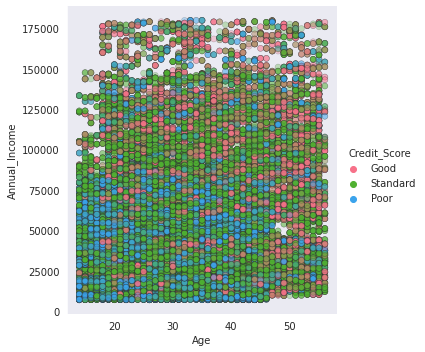

In [5]:
sns.relplot(x = 'Age', y = 'Annual_Income' ,hue = 'Credit_Score', 
            data = df,alpha=.3, edgecolor=".2", linewidth=.5,palette = 'husl')

<AxesSubplot:>

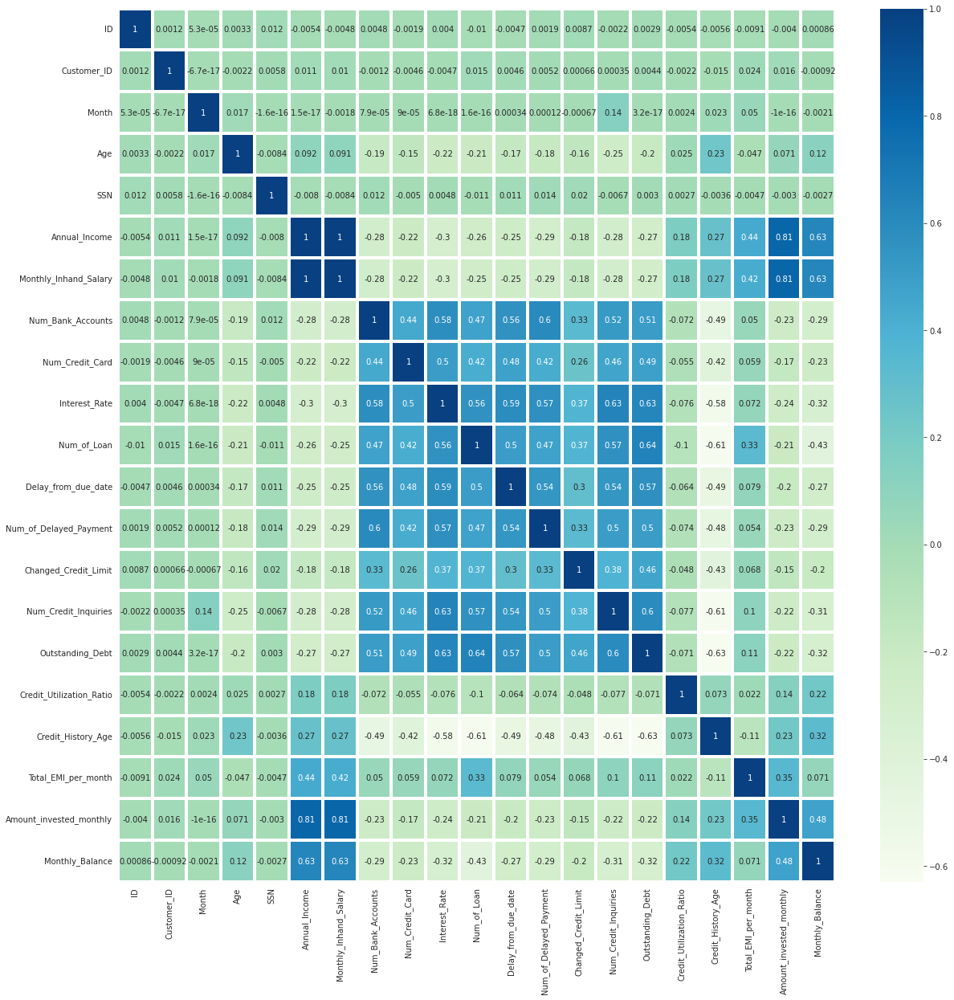

In [6]:
plt.figure(figsize=(20,20))
sns.heatmap(df.corr(),cbar = True,cmap = 'GnBu', annot =True, linewidths=4, linecolor='white')

In [7]:
df.dtypes == object

ID                          False
Customer_ID                 False
Month                       False
Name                         True
Age                         False
SSN                         False
Occupation                   True
Annual_Income               False
Monthly_Inhand_Salary       False
Num_Bank_Accounts           False
Num_Credit_Card             False
Interest_Rate               False
Num_of_Loan                 False
Type_of_Loan                 True
Delay_from_due_date         False
Num_of_Delayed_Payment      False
Changed_Credit_Limit        False
Num_Credit_Inquiries        False
Credit_Mix                   True
Outstanding_Debt            False
Credit_Utilization_Ratio    False
Credit_History_Age          False
Payment_of_Min_Amount        True
Total_EMI_per_month         False
Amount_invested_monthly     False
Payment_Behaviour            True
Monthly_Balance             False
Credit_Score                 True
dtype: bool

<Figure size 1440x1440 with 0 Axes>

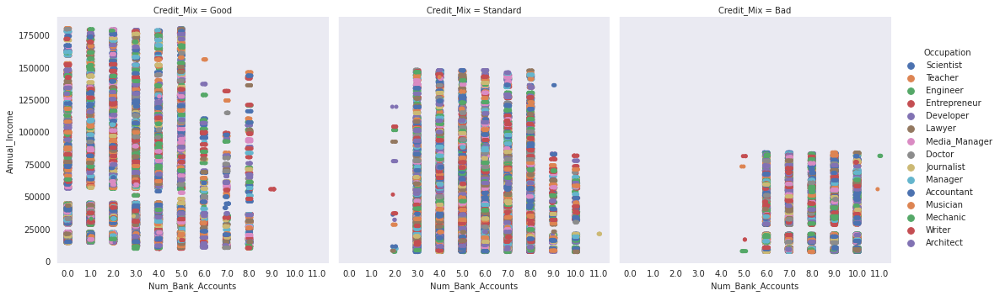

In [15]:
plt.figure(figsize=(20,20))
sns.catplot(data=df, x="Num_Bank_Accounts", y="Annual_Income", 
            hue="Occupation",col = 'Credit_Mix', palette="deep")

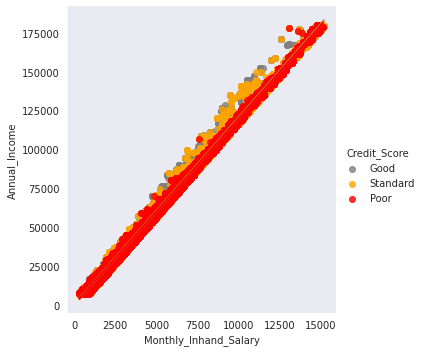

In [19]:
sns.lmplot(data=df, x="Monthly_Inhand_Salary", y="Annual_Income", hue="Credit_Score",
           height=5,palette= ['Grey','Orange','r'])

array([[<AxesSubplot:title={'center':'ID'}>,
        <AxesSubplot:title={'center':'Customer_ID'}>,
        <AxesSubplot:title={'center':'Month'}>,
        <AxesSubplot:title={'center':'Age'}>,
        <AxesSubplot:title={'center':'SSN'}>],
       [<AxesSubplot:title={'center':'Annual_Income'}>,
        <AxesSubplot:title={'center':'Monthly_Inhand_Salary'}>,
        <AxesSubplot:title={'center':'Num_Bank_Accounts'}>,
        <AxesSubplot:title={'center':'Num_Credit_Card'}>,
        <AxesSubplot:title={'center':'Interest_Rate'}>],
       [<AxesSubplot:title={'center':'Num_of_Loan'}>,
        <AxesSubplot:title={'center':'Delay_from_due_date'}>,
        <AxesSubplot:title={'center':'Num_of_Delayed_Payment'}>,
        <AxesSubplot:title={'center':'Changed_Credit_Limit'}>,
        <AxesSubplot:title={'center':'Num_Credit_Inquiries'}>],
       [<AxesSubplot:title={'center':'Outstanding_Debt'}>,
        <AxesSubplot:title={'center':'Credit_Utilization_Ratio'}>,
        <AxesSubplot:title={'ce

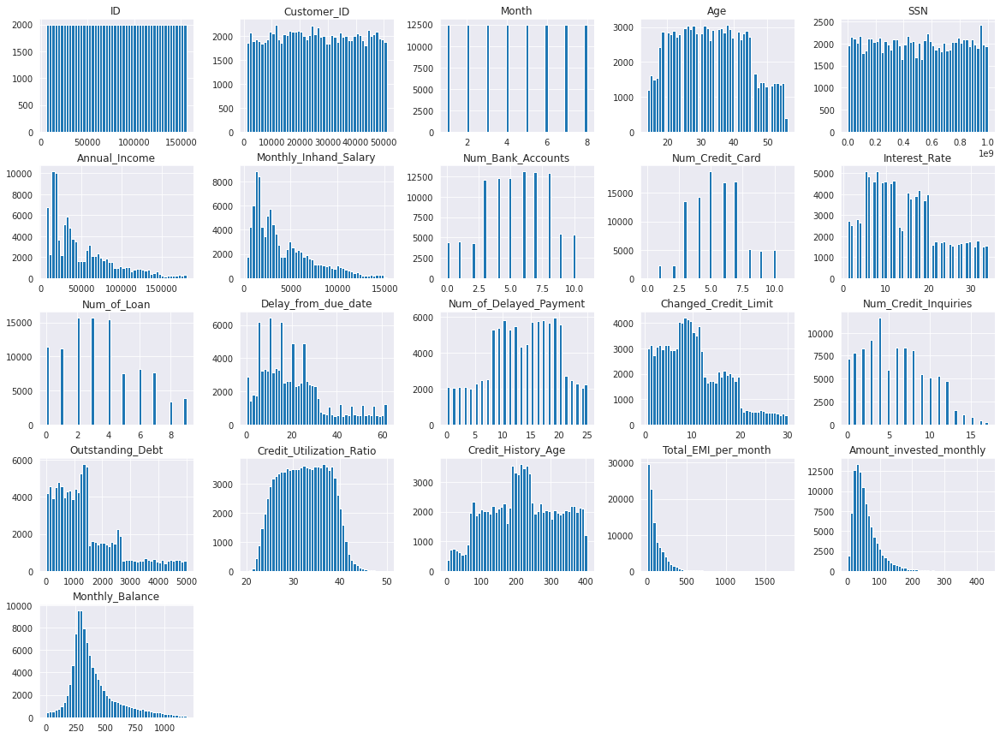

In [20]:
df.hist(bins=50, figsize=(20,15))

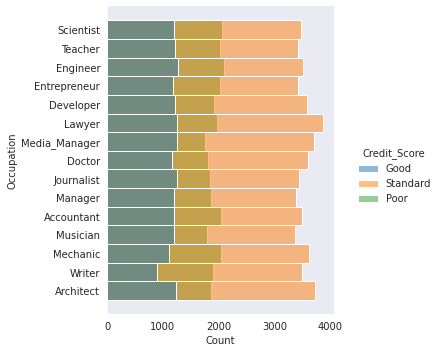

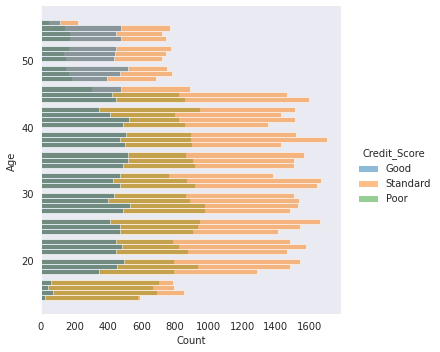

In [26]:
sns.displot(data=df, y="Occupation", hue="Credit_Score")
# plt.show()
sns.displot(data=df, y="Age", hue="Credit_Score")
# plt.show()

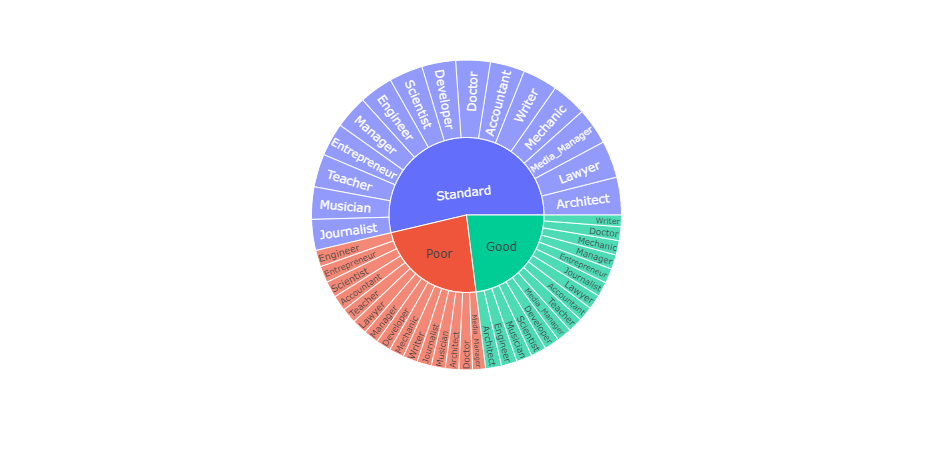

In [34]:
fig = px.sunburst(df, path=['Credit_Score', 'Occupation'], values='Annual_Income')
fig.show()

Text(0.5, 1.0, 'Relation between the incomes and number of bank due to credit Mix')

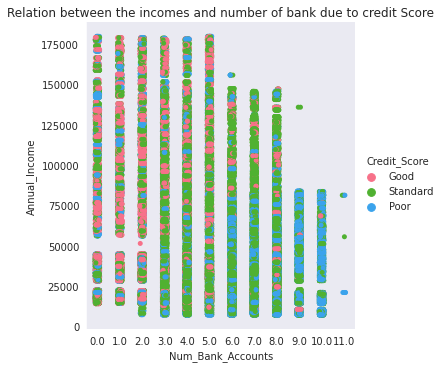

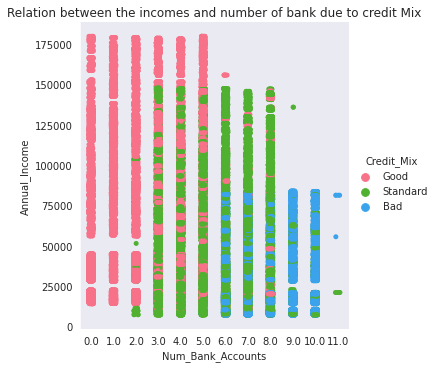

In [30]:
sns.catplot(x = 'Num_Bank_Accounts', y = 'Annual_Income' ,hue = 'Credit_Score', data = df,palette = 'husl')
plt.title('Relation between the incomes and number of bank due to credit Score')

sns.catplot(x = 'Num_Bank_Accounts', y = 'Annual_Income' ,hue = 'Credit_Mix', data = df,palette = 'husl')
plt.title('Relation between the incomes and number of bank due to credit Mix')

Text(0.5, 1.0, 'Influence of the loans due to Interest rate')

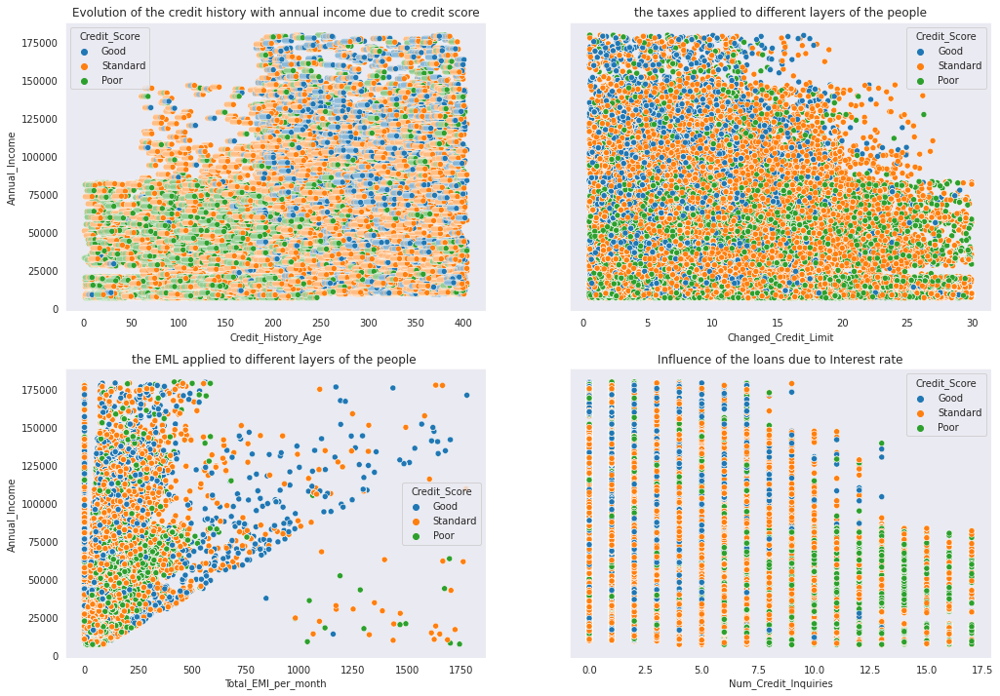

In [38]:
fig, axes = plt.subplots(2, 2, figsize=(17, 12), sharey=True)

sns.scatterplot(x = 'Credit_History_Age', y = 'Annual_Income' ,hue = 'Credit_Score', 
                data = df,ax = axes[0,0])
axes[0,0].set_title('Evolution of the credit history with annual income due to credit score')

sns.scatterplot(x='Changed_Credit_Limit',y=  'Annual_Income' ,hue = 'Credit_Score', data = df,
                ax = axes[0,1])
axes[0,1].set_title('the taxes applied to different layers of the people')

sns.scatterplot(x = 'Total_EMI_per_month', y = 'Annual_Income' ,hue = 'Credit_Score', data = df,
                ax = axes[1,0])
axes[1,0].set_title('the EML applied to different layers of the people ')

sns.scatterplot(x = 'Num_Credit_Inquiries', y = 'Annual_Income' ,hue = 'Credit_Score', data = df,
               ax = axes[1,1])
axes[1,1].set_title('Influence of the loans due to Interest rate')

Text(0.5, 1.0, 'Influence of the loans due to Interest rate')

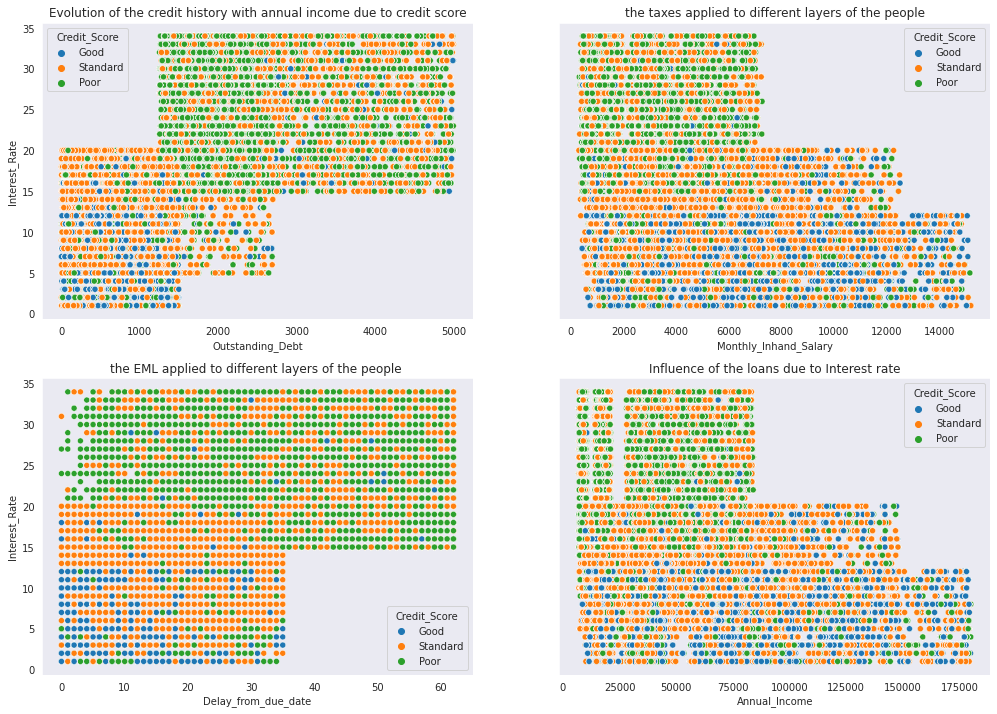

In [39]:
fig, axes = plt.subplots(2, 2, figsize=(17, 12), sharey=True)

sns.scatterplot(x = 'Outstanding_Debt', y = 'Interest_Rate' ,hue = 'Credit_Score', data = df,
                ax = axes[0,0])
axes[0,0].set_title('Evolution of the credit history with annual income due to credit score')

sns.scatterplot(x='Monthly_Inhand_Salary',y=  'Interest_Rate' ,hue = 'Credit_Score', data = df,
                ax = axes[0,1])
axes[0,1].set_title('the taxes applied to different layers of the people')

sns.scatterplot(x = 'Delay_from_due_date', y = 'Interest_Rate' ,hue = 'Credit_Score', data = df,
                ax = axes[1,0])
axes[1,0].set_title('the EML applied to different layers of the people ')

sns.scatterplot(x = 'Annual_Income', y = 'Interest_Rate' ,hue = 'Credit_Score', data = df,
                ax = axes[1,1])
axes[1,1].set_title('Influence of the loans due to Interest rate')

Text(0.5, 1.0, 'Influence of the loans due to Interest rate')

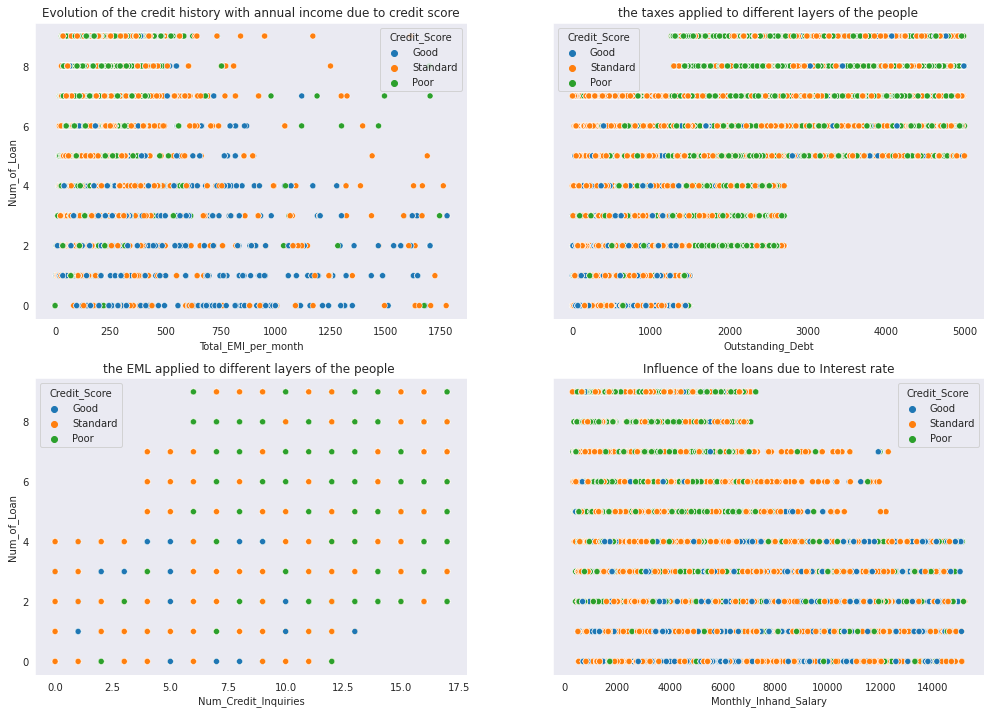

In [40]:
fig, axes = plt.subplots(2, 2, figsize=(17, 12), sharey=True)

sns.scatterplot(x = 'Total_EMI_per_month', y = 'Num_of_Loan' ,hue = 'Credit_Score', data = df, 
                ax = axes[0,0])
axes[0,0].set_title('Evolution of the credit history with annual income due to credit score')

sns.scatterplot(x='Outstanding_Debt',y=  'Num_of_Loan' ,hue = 'Credit_Score', data = df, 
                ax = axes[0,1])
axes[0,1].set_title('the taxes applied to different layers of the people')

sns.scatterplot(x = 'Num_Credit_Inquiries', y = 'Num_of_Loan' ,hue = 'Credit_Score', data = df, 
                ax = axes[1,0])
axes[1,0].set_title('the EML applied to different layers of the people ')

sns.scatterplot(x = 'Monthly_Inhand_Salary', y = 'Num_of_Loan' ,hue = 'Credit_Score', data = df, 
                ax = axes[1,1])
axes[1,1].set_title('Influence of the loans due to Interest rate')

<Figure size 3024x2880 with 0 Axes>

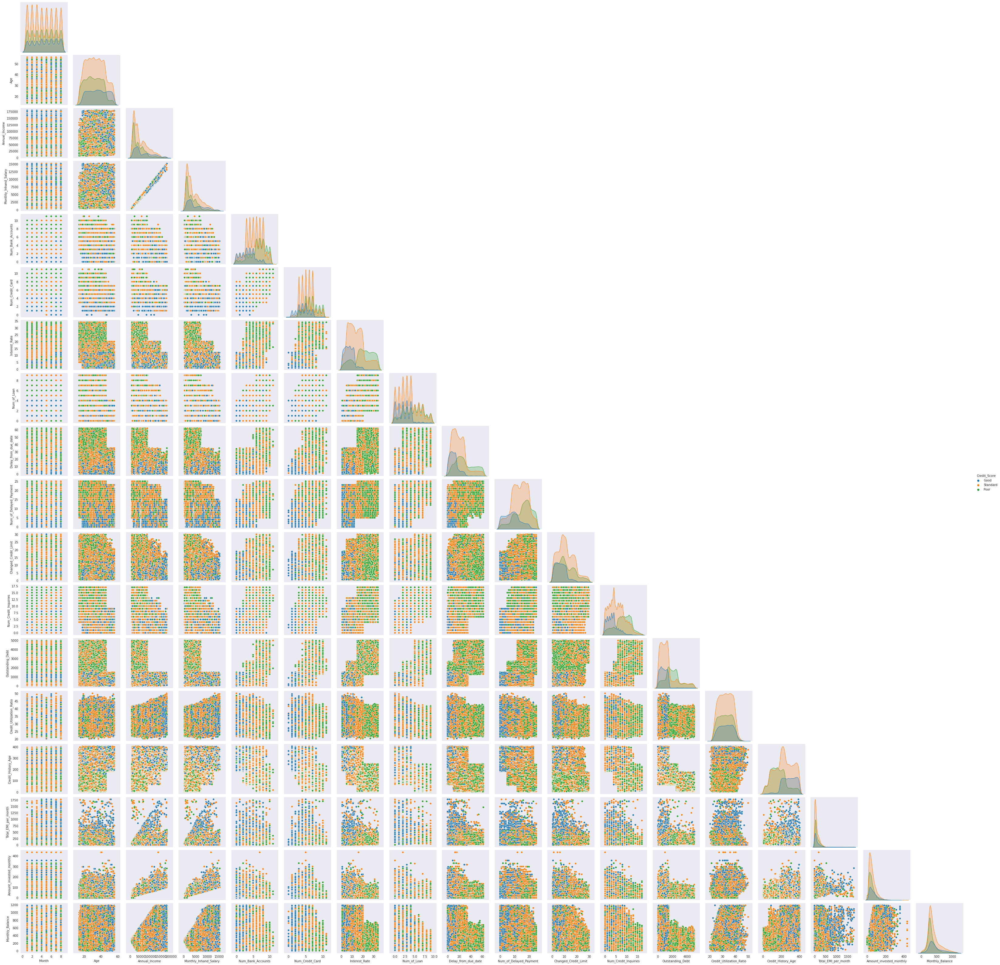

In [47]:
%%time

plt.figure(figsize=(42,40))
sns.pairplot(df, hue="Credit_Score",corner=True)

## **Detecting and cleaning Outliers**

/opt/conda/lib/python3.7/site-packages/seaborn/distributions.py:2619: FutureWarning:

`distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).

/opt/conda/lib/python3.7/site-packages/seaborn/_decorators.py:43: FutureWarning:

Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.



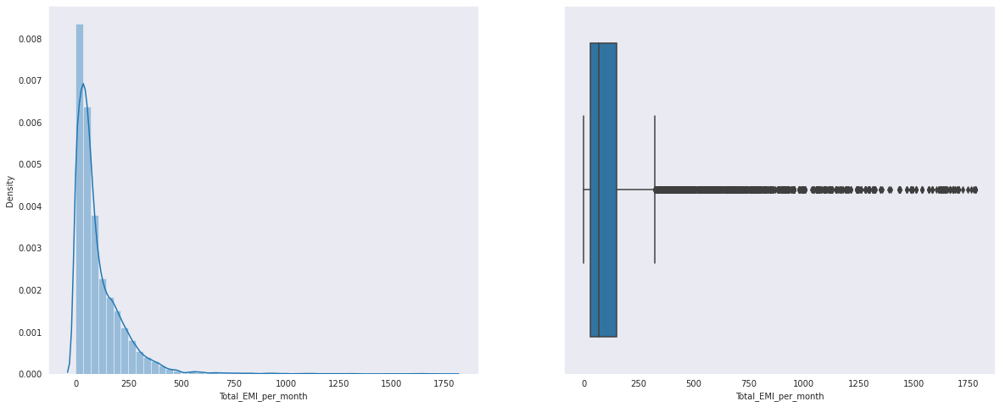

/opt/conda/lib/python3.7/site-packages/seaborn/distributions.py:2619: FutureWarning:

`distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).

/opt/conda/lib/python3.7/site-packages/seaborn/_decorators.py:43: FutureWarning:

Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.



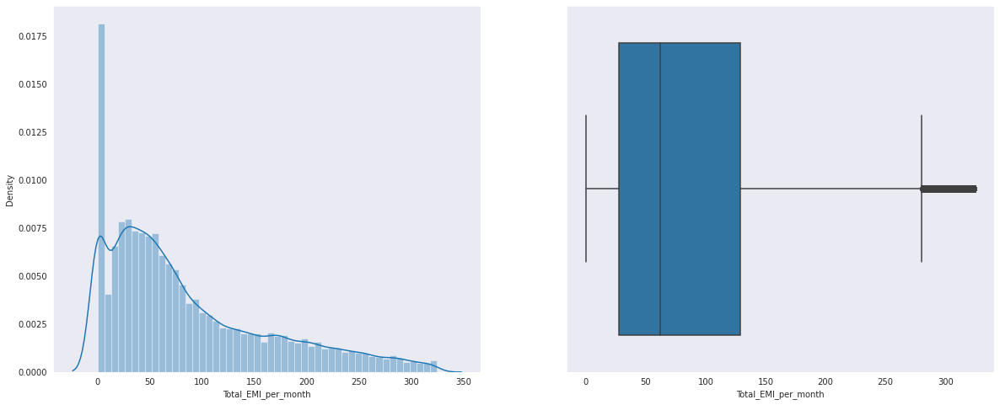

In [7]:
def detect_clean_outliers(data, col, show_plots = True):
    if show_plots:
        plt.figure(figsize=(20,8))
        plt.subplot(1,2,1)
        sns.distplot(data[col])
        plt.subplot(1,2,2)
        sns.boxplot(data[col])
        plt.show()
    
    percentile25 = data[col].quantile(0.25)
    percentile75 = data[col].quantile(0.75)
    iqr = percentile75 - percentile25
    upper_limit = percentile75 + 1.5 * iqr
    lower_limit = percentile25 - 1.5 * iqr

    data = data[(data[col]>lower_limit) & (data[col]<upper_limit)]
    data = data.dropna()
    
    if show_plots:
        plt.figure(figsize=(20,8))
        plt.subplot(1,2,1)
        sns.distplot(data[col])
        plt.subplot(1,2,2)
        sns.boxplot(data[col])
        plt.show()
    
detect_clean_outliers(df, 'Total_EMI_per_month')

/opt/conda/lib/python3.7/site-packages/seaborn/distributions.py:2619: FutureWarning:

`distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).

/opt/conda/lib/python3.7/site-packages/seaborn/_decorators.py:43: FutureWarning:

Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.



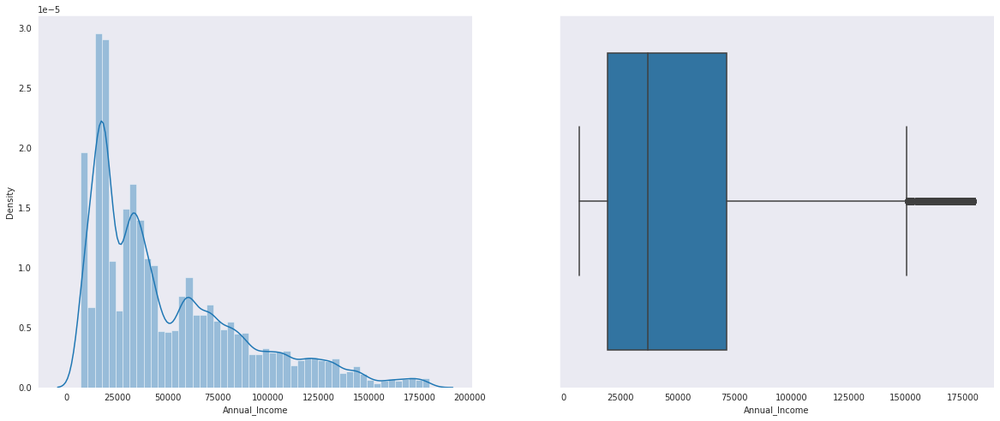

/opt/conda/lib/python3.7/site-packages/seaborn/distributions.py:2619: FutureWarning:

`distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).

/opt/conda/lib/python3.7/site-packages/seaborn/_decorators.py:43: FutureWarning:

Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.



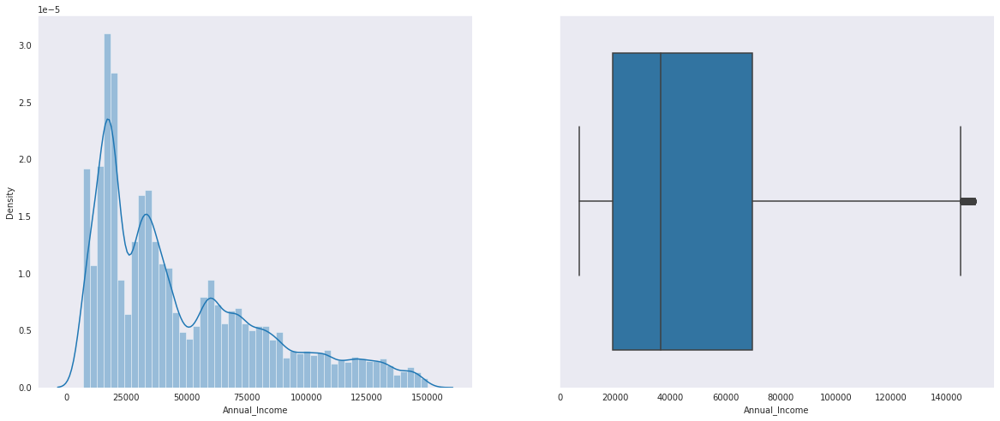

In [8]:
detect_clean_outliers(df, 'Annual_Income')

In [9]:
df.dtypes

ID                            int64
Customer_ID                   int64
Month                         int64
Name                         object
Age                         float64
SSN                         float64
Occupation                   object
Annual_Income               float64
Monthly_Inhand_Salary       float64
Num_Bank_Accounts           float64
Num_Credit_Card             float64
Interest_Rate               float64
Num_of_Loan                 float64
Type_of_Loan                 object
Delay_from_due_date         float64
Num_of_Delayed_Payment      float64
Changed_Credit_Limit        float64
Num_Credit_Inquiries        float64
Credit_Mix                   object
Outstanding_Debt            float64
Credit_Utilization_Ratio    float64
Credit_History_Age          float64
Payment_of_Min_Amount        object
Total_EMI_per_month         float64
Amount_invested_monthly     float64
Payment_Behaviour            object
Monthly_Balance             float64
Credit_Score                

In [10]:
df.shape

(100000, 28)

***Now, before moving forward, we decide to drop Type_of_Loan feature because from the previous notebook, we can clearly see, there are certain rows having 'no data'. instead of deleting the row, we can delete the column to prevent data loss. Also, from the EDA, we can see credit score is more dependent on other feature like income, credit mix, interest, etc. as observed from the EDA.***

In [11]:
df.drop(['ID', 'Customer_ID', 'Name', 'SSN'],axis=1,inplace=True)
df.drop(['Type_of_Loan'], axis=1, inplace=True)

In [12]:
df.shape

(100000, 23)

## **Pre-processing the input features and encoding them**

In [13]:
df.dtypes

Month                         int64
Age                         float64
Occupation                   object
Annual_Income               float64
Monthly_Inhand_Salary       float64
Num_Bank_Accounts           float64
Num_Credit_Card             float64
Interest_Rate               float64
Num_of_Loan                 float64
Delay_from_due_date         float64
Num_of_Delayed_Payment      float64
Changed_Credit_Limit        float64
Num_Credit_Inquiries        float64
Credit_Mix                   object
Outstanding_Debt            float64
Credit_Utilization_Ratio    float64
Credit_History_Age          float64
Payment_of_Min_Amount        object
Total_EMI_per_month         float64
Amount_invested_monthly     float64
Payment_Behaviour            object
Monthly_Balance             float64
Credit_Score                 object
dtype: object

In [14]:
df.Payment_of_Min_Amount.unique()

array(['No', 'NM', 'Yes'], dtype=object)

In [15]:
df.Payment_Behaviour.unique()

array(['High_spent_Small_value_payments',
       'Low_spent_Large_value_payments',
       'Low_spent_Medium_value_payments',
       'Low_spent_Small_value_payments',
       'High_spent_Medium_value_payments',
       'High_spent_Large_value_payments'], dtype=object)

In [16]:
from sklearn.preprocessing import OrdinalEncoder
ordinal_encoder = OrdinalEncoder()
cols_to_be_encoded = []
for column in df.columns:
    if df[column].dtypes == 'object':
        cols_to_be_encoded.append(column)
        
df[cols_to_be_encoded] = ordinal_encoder.fit_transform(df[cols_to_be_encoded])

In [19]:
pickle.dump(ordinal_encoder, open("ordinal_encoder.pkl", 'wb'))

In [20]:
ordinal_encoder.categories_

[array(['Accountant', 'Architect', 'Developer', 'Doctor', 'Engineer',
        'Entrepreneur', 'Journalist', 'Lawyer', 'Manager', 'Mechanic',
        'Media_Manager', 'Musician', 'Scientist', 'Teacher', 'Writer'],
       dtype=object),
 array(['Bad', 'Good', 'Standard'], dtype=object),
 array(['NM', 'No', 'Yes'], dtype=object),
 array(['High_spent_Large_value_payments',
        'High_spent_Medium_value_payments',
        'High_spent_Small_value_payments',
        'Low_spent_Large_value_payments',
        'Low_spent_Medium_value_payments',
        'Low_spent_Small_value_payments'], dtype=object),
 array(['Good', 'Poor', 'Standard'], dtype=object)]

In [21]:
ordinal_encoder.n_features_in_

5

In [22]:
ordinal_encoder.feature_names_in_

array(['Occupation', 'Credit_Mix', 'Payment_of_Min_Amount',
       'Payment_Behaviour', 'Credit_Score'], dtype=object)

In [23]:
dataframe = pd.read_csv(config.input_dataframe_string)
dataframe.Occupation, df.Occupation

(0        Scientist
 1        Scientist
 2        Scientist
 3        Scientist
 4        Scientist
            ...    
 99995     Mechanic
 99996     Mechanic
 99997     Mechanic
 99998     Mechanic
 99999     Mechanic
 Name: Occupation, Length: 100000, dtype: object,
 0        12.0
 1        12.0
 2        12.0
 3        12.0
 4        12.0
          ... 
 99995     9.0
 99996     9.0
 99997     9.0
 99998     9.0
 99999     9.0
 Name: Occupation, Length: 100000, dtype: float64)

In [24]:
del dataframe

In [25]:
X = df.copy()
Y = X.pop("Credit_Score")

In [26]:
# for colname in X.select_dtypes("object"):
#     X[colname], _ = X[colname].factorize()

# discrete_features = X.dtypes != object

In [27]:
# print(X.Occupation)
# X.Occupation,_ = X.Occupation.factorize()
# print(X.Occupation)

In [28]:
X.dtypes

Month                         int64
Age                         float64
Occupation                  float64
Annual_Income               float64
Monthly_Inhand_Salary       float64
Num_Bank_Accounts           float64
Num_Credit_Card             float64
Interest_Rate               float64
Num_of_Loan                 float64
Delay_from_due_date         float64
Num_of_Delayed_Payment      float64
Changed_Credit_Limit        float64
Num_Credit_Inquiries        float64
Credit_Mix                  float64
Outstanding_Debt            float64
Credit_Utilization_Ratio    float64
Credit_History_Age          float64
Payment_of_Min_Amount       float64
Total_EMI_per_month         float64
Amount_invested_monthly     float64
Payment_Behaviour           float64
Monthly_Balance             float64
dtype: object

In [29]:
X.shape, Y.shape

((100000, 22), (100000,))

## **Deleting unneccesary features**

In [30]:
from sklearn.feature_selection import mutual_info_regression

def make_mi_scores(X, Y):
    mi_scores = mutual_info_regression(X, Y, discrete_features=False)
    mi_scores = pd.Series(mi_scores, name="MI Scores", index=X.columns)
    mi_scores = mi_scores.sort_values(ascending=False)
    return mi_scores

mi_scores = make_mi_scores(X, Y)

Annual_Income               0.623330
Monthly_Inhand_Salary       0.622236
Amount_invested_monthly     0.617791
Outstanding_Debt            0.611336
Total_EMI_per_month         0.565270
Credit_Mix                  0.181167
Interest_Rate               0.170276
Delay_from_due_date         0.123384
Num_Credit_Inquiries        0.118849
Num_Credit_Card             0.116568
Changed_Credit_Limit        0.104611
Payment_of_Min_Amount       0.102179
Credit_History_Age          0.099456
Num_Bank_Accounts           0.098852
Num_of_Delayed_Payment      0.091015
Num_of_Loan                 0.087828
Monthly_Balance             0.037155
Age                         0.027818
Payment_Behaviour           0.015238
Occupation                  0.006150
Month                       0.004941
Credit_Utilization_Ratio    0.000000
Name: MI Scores, dtype: float64


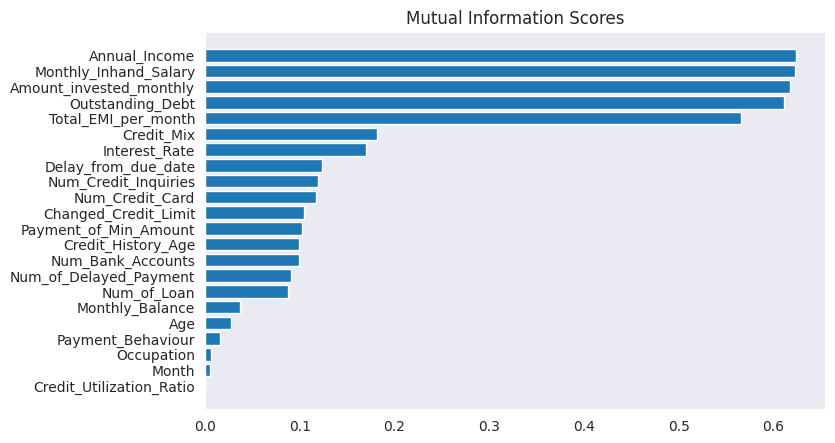

In [31]:
def plot_mi_scores(scores):
    scores = scores.sort_values(ascending=True)
    width = np.arange(len(scores))
    ticks = list(scores.index)
    plt.barh(width, scores)
    plt.yticks(width, ticks)
    plt.title("Mutual Information Scores")

print(mi_scores)
plt.figure(dpi=100, figsize=(8, 5))
plot_mi_scores(mi_scores)

***Now, we can delete unneccesary feature, or bottom 6 features having scores less than 0.08 (as 0.08 approx. = 0.1)***

In [32]:
df.drop(['Month','Monthly_Balance', 'Age',
                'Occupation','Credit_Utilization_Ratio',
                 'Payment_Behaviour'] ,axis= 1 , inplace = True)

In [33]:
df.Annual_Income

0        19114.12
1        19114.12
2        19114.12
3        19114.12
4        19114.12
           ...   
99995    39628.99
99996    39628.99
99997    39628.99
99998    39628.99
99999    39628.99
Name: Annual_Income, Length: 100000, dtype: float64

In [34]:
cols_to_be_scaled = ['Annual_Income', 'Monthly_Inhand_Salary', 'Outstanding_Debt', 'Credit_History_Age',
                    'Total_EMI_per_month', 'Amount_invested_monthly']
df[cols_to_be_scaled] = (df[cols_to_be_scaled] - df[cols_to_be_scaled].mean()) / df[cols_to_be_scaled].std()

In [35]:
df.sample(4)

,Annual_Income,Monthly_Inhand_Salary,Num_Bank_Accounts,Num_Credit_Card,Interest_Rate,Num_of_Loan,Delay_from_due_date,Num_of_Delayed_Payment,Changed_Credit_Limit,Num_Credit_Inquiries,Credit_Mix,Outstanding_Debt,Credit_History_Age,Payment_of_Min_Amount,Total_EMI_per_month,Amount_invested_monthly,Credit_Score
23575,0.826161,0.807575,5.0,3.0,6.0,3.0,17.0,9.0,2.46,5.0,1.0,-0.538122,1.332048,1.0,0.155699,0.101549,2.0
77314,-1.071227,-1.031077,6.0,9.0,32.0,8.0,21.0,15.0,23.71,13.0,0.0,1.644041,-1.496984,2.0,-0.532287,-0.807086,2.0
33195,1.858267,1.847950,3.0,7.0,3.0,1.0,8.0,2.0,3.00,1.0,1.0,-0.382598,-0.293141,1.0,-0.089530,0.935659,0.0
53831,-0.864391,-0.850895,8.0,9.0,21.0,2.0,19.0,25.0,9.03,10.0,0.0,0.015556,-1.446824,2.0,-0.609342,-0.359814,1.0


***Now, we divide our data into training and validation data***

In [36]:
y = df.Credit_Score.values
x = df.drop('Credit_Score',axis=1).values
print(x)
print(y)
print(x.shape)
print(y.shape)
x_train,x_test,y_train,y_test = train_test_split(x,y,test_size = 0.10, random_state=25)
print(x_train.shape,x_test.shape,y_train.shape,y_test.shape)

[[-0.81962081 -0.74454033  3.         ...  1.         -0.43944623
  -0.86230658]
 [-0.81962081 -0.74454033  3.         ...  1.         -0.43944623
  -0.86230658]
 [-0.81962081 -0.74454033  3.         ...  1.         -0.43944623
  -0.86230658]
 ...
 [-0.28397644 -0.26294453  4.         ...  1.         -0.54885311
  -0.79659782]
 [-0.28397644 -0.26294453  4.         ...  1.         -0.54885311
  -0.79659782]
 [-0.28397644 -0.26294453  4.         ...  1.         -0.54885311
  -0.79659782]]
[0. 0. 0. ... 1. 2. 1.]
(100000, 16)
(100000,)
(90000, 16) (10000, 16) (90000,) (10000,)


## **ML models training and testing**

In [125]:
import xgboost as xgb

xgb_classifier = xgb.XGBClassifier(n_estimators = 2000,bootstrap = True)
xgb_classifier

XGBClassifier(base_score=None, booster=None, bootstrap=True, callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
              colsample_bytree=None, early_stopping_rounds=None,
              enable_categorical=False, eval_metric=None, gamma=None,
              gpu_id=None, grow_policy=None, importance_type=None,
              interaction_constraints=None, learning_rate=None, max_bin=None,
              max_cat_to_onehot=None, max_delta_step=None, max_depth=None,
              max_leaves=None, min_child_weight=None, missing=nan,
              monotone_constraints=None, n_estimators=2000, n_jobs=None,
              num_parallel_tree=None, predictor=None, random_state=None,
              reg_alpha=None, ...)

In [126]:
%%time
xgb_classifier.fit(x_train, y_train)

[13:39:33] WARNING: ../src/learner.cc:627: 
Parameters: { "bootstrap" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


CPU times: user 24min 4s, sys: 2.95 s, total: 24min 7s
Wall time: 6min 8s


XGBClassifier(base_score=0.5, booster='gbtree', bootstrap=True, callbacks=None,
              colsample_bylevel=1, colsample_bynode=1, colsample_bytree=1,
              early_stopping_rounds=None, enable_categorical=False,
              eval_metric=None, gamma=0, gpu_id=-1, grow_policy='depthwise',
              importance_type=None, interaction_constraints='',
              learning_rate=0.300000012, max_bin=256, max_cat_to_onehot=4,
              max_delta_step=0, max_depth=6, max_leaves=0, min_child_weight=1,
              missing=nan, monotone_constraints='()', n_estimators=2000,
              n_jobs=0, num_parallel_tree=1, objective='multi:softprob',
              predictor='auto', random_state=0, ...)

In [127]:
print(f"training accuracy = {xgb_classifier.score(x_train,y_train)}")
print(f"testing accuracy = {accuracy_score(y_test, xgb_classifier.predict(x_test))}")

training accuracy = 0.9867555555555556
testing accuracy = 0.8284


In [128]:
print('\n training clasification report:\n', classification_report(y_train,xgb_classifier.predict(x_train)))


 training clasification report:
               precision    recall  f1-score   support

         0.0       0.98      1.00      0.99     16018
         1.0       0.97      1.00      0.98     26117
         2.0       1.00      0.98      0.99     47865

    accuracy                           0.99     90000
   macro avg       0.98      0.99      0.99     90000
weighted avg       0.99      0.99      0.99     90000



In [129]:
print('\n testing clasification report:\n', classification_report(y_test,xgb_classifier.predict(x_test)))


 testing clasification report:
               precision    recall  f1-score   support

         0.0       0.80      0.80      0.80      1810
         1.0       0.82      0.84      0.83      2881
         2.0       0.84      0.83      0.84      5309

    accuracy                           0.83     10000
   macro avg       0.82      0.82      0.82     10000
weighted avg       0.83      0.83      0.83     10000



train ROC/ AUC


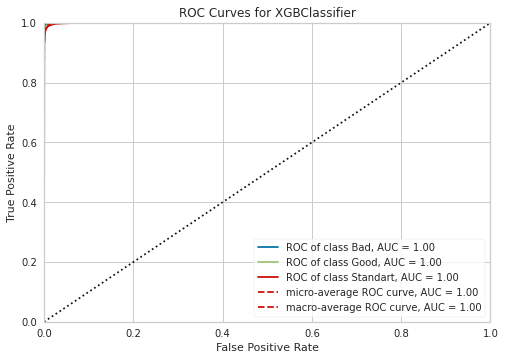

In [139]:
from yellowbrick.classifier import ROCAUC
model = xgb_classifier
print('train ROC/ AUC')
visualizer = ROCAUC(model, encoder={0: 'Bad', 1: 'Good', 2: 'Standart'})
visualizer.fit(x_train, y_train)        # Fit the training data to the visualizer
visualizer.score(x_train, y_train)        # Evaluate the model on the test data
visualizer.show(); 

testing ROC/ AUC


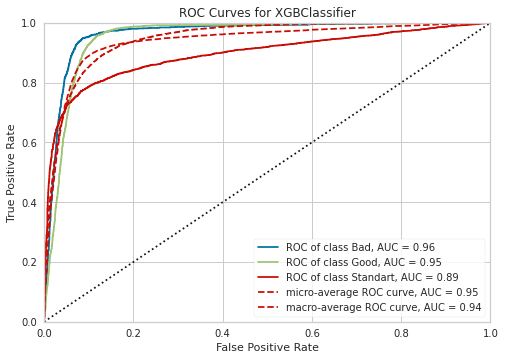

In [132]:
from yellowbrick.classifier import ROCAUC
model = xgb_classifier
print('testing ROC/ AUC')
visualizer = ROCAUC(model, encoder={0: 'Bad', 1: 'Good', 2: 'Standart'})
visualizer.fit(x_test, y_test)        # Fit the training data to the visualizer
visualizer.score(x_test, y_test)        # Evaluate the model on the test data
visualizer.show(); 

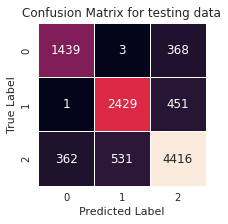

In [135]:
matrix = confusion_matrix(y_test,xgb_classifier.predict(x_test))
plt.figure(figsize=(3,3))
sns.heatmap(matrix,annot=True, cbar=False, linewidth=0.5,fmt="d")
plt.ylabel('True Label')
plt.xlabel('Predicted Label')
plt.title('Confusion Matrix for testing data');

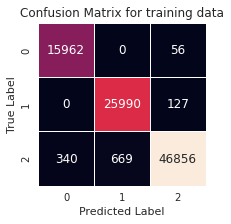

In [136]:
matrix = confusion_matrix(y_train,xgb_classifier.predict(x_train))
plt.figure(figsize=(3,3))
sns.heatmap(matrix,annot=True, cbar=False, linewidth=0.5,fmt="d")
plt.ylabel('True Label')
plt.xlabel('Predicted Label')
plt.title('Confusion Matrix for training data');

***as we can see that we are getting accuracy as compared to KNN and logistic regression (see previous notebook) but we can achieve more accuracy because data is imbalanced. Thus, after balancing it, we can achieve more decent accuracy***

In [37]:
SMT = SMOTE()
x_SMT, y_SMT = SMT.fit_resample(x,y)
x_train_smote, x_test_smote, y_train_smote, y_test_smote = train_test_split(x_SMT, y_SMT, 
                                                                            test_size=0.15,
                                                                            random_state=42)
print(x_train_smote.shape,x_test_smote.shape,y_train_smote.shape,y_test_smote.shape)

(135593, 16) (23929, 16) (135593,) (23929,)


In [38]:
from yellowbrick.classifier import ROCAUC
import time
def info_of_data_from_model(model, x_train, x_test, y_train, y_test, show_train = True):
    start_time = time.time()
    if show_train:
        print(f"training accuracy = {model.score(x_train,y_train)}")
    print(f"testing accuracy = {accuracy_score(y_test, model.predict(x_test))}")
    
    if show_train:
        print('\n training clasification report:\n', classification_report(y_train,model.predict(x_train)))
    print('\n testing clasification report:\n', classification_report(y_test,model.predict(x_test)))
    
    if show_train:
        print('train ROC/ AUC')
        visualizer = ROCAUC(model, encoder={0: 'Bad', 1: 'Good', 2: 'Standart'})
        visualizer.fit(x_train, y_train)        # Fit the training data to the visualizer
        visualizer.score(x_train, y_train)        # Evaluate the model on the test data
        visualizer.show(); 

    print('testing ROC/ AUC')
    visualizer = ROCAUC(model, encoder={0: 'Bad', 1: 'Good', 2: 'Standart'})
    visualizer.fit(x_test, y_test)        # Fit the training data to the visualizer
    visualizer.score(x_test, y_test)        # Evaluate the model on the test data
    visualizer.show(); 

    matrix = confusion_matrix(y_test,model.predict(x_test))
    plt.figure(figsize=(3,3))
    sns.heatmap(matrix,annot=True, cbar=False, linewidth=0.5,fmt="d")
    plt.ylabel('True Label')
    plt.xlabel('Predicted Label')
    plt.title('Confusion Matrix for testing data');
    plt.show()
    
    if show_train:
        matrix = confusion_matrix(y_train,model.predict(x_train))
        plt.figure(figsize=(3,3))
        sns.heatmap(matrix,annot=True, cbar=False, linewidth=0.5,fmt="d")
        plt.ylabel('True Label')
        plt.xlabel('Predicted Label')
        plt.title('Confusion Matrix for training data');
        plt.show()
    
    print("--- %s seconds ---" % (time.time() - start_time))

In [39]:
import gc 
del X
del Y
del x_train
del y_train
gc.collect()

40035

> ***1. Extra tree classifier model***

In [ ]:
import pickle

In [145]:
%%time

ETC_model = ExtraTreesClassifier(n_estimators = 2000,bootstrap = True)
ETC_model.fit(x_train_smote, y_train_smote)

CPU times: user 5min 59s, sys: 7.13 s, total: 6min 6s
Wall time: 6min 6s


ExtraTreesClassifier(bootstrap=True, n_estimators=2000)

training accuracy = 0.9998893748202341
testing accuracy = 0.8876258932675832

 training clasification report:
               precision    recall  f1-score   support

         0.0       1.00      1.00      1.00     45134
         1.0       1.00      1.00      1.00     45281
         2.0       1.00      1.00      1.00     45178

    accuracy                           1.00    135593
   macro avg       1.00      1.00      1.00    135593
weighted avg       1.00      1.00      1.00    135593


 testing clasification report:
               precision    recall  f1-score   support

         0.0       0.91      0.94      0.93      8040
         1.0       0.88      0.92      0.90      7893
         2.0       0.87      0.80      0.83      7996

    accuracy                           0.89     23929
   macro avg       0.89      0.89      0.89     23929
weighted avg       0.89      0.89      0.89     23929

train ROC/ AUC


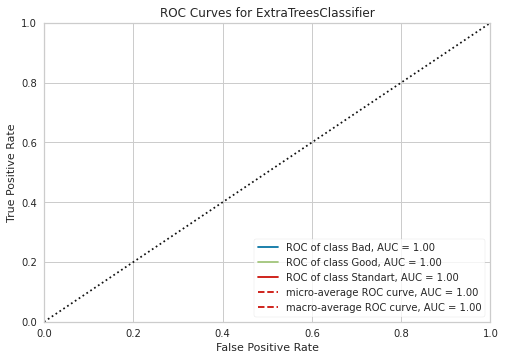

testing ROC/ AUC


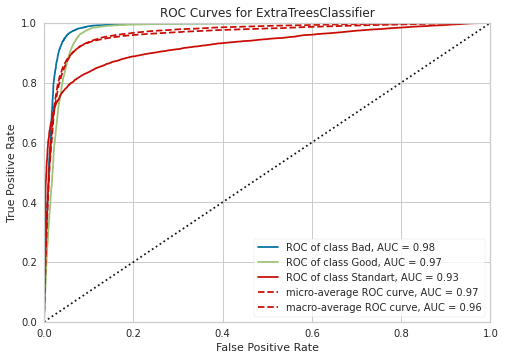

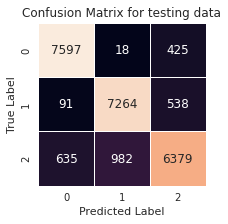

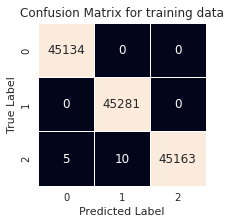

--- 618.9145781993866 seconds ---
CPU times: user 10min 19s, sys: 657 ms, total: 10min 19s
Wall time: 10min 18s


In [148]:
%%time

info_of_data_from_model(ETC_model, x_train_smote, x_test_smote,
                        y_train_smote, y_test_smote, show_train = True)

testing accuracy = 0.9749

 testing clasification report:
               precision    recall  f1-score   support

         0.0       0.96      0.98      0.97      1810
         1.0       0.96      0.98      0.97      2881
         2.0       0.98      0.97      0.98      5309

    accuracy                           0.97     10000
   macro avg       0.97      0.98      0.97     10000
weighted avg       0.98      0.97      0.97     10000

testing ROC/ AUC


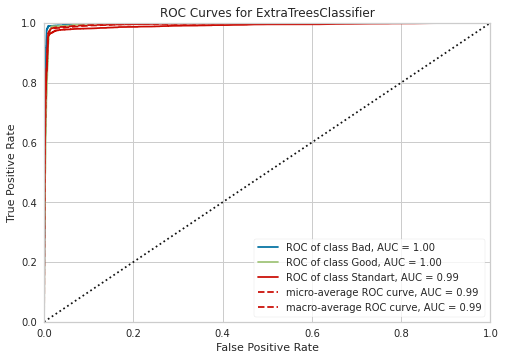

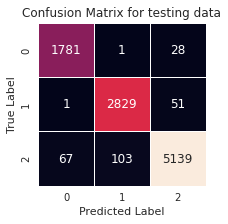

--- 52.500710248947144 seconds ---
CPU times: user 52.7 s, sys: 289 ms, total: 53 s
Wall time: 52.5 s


In [149]:
%%time

info_of_data_from_model(ETC_model, x_train_smote, x_test,
                        y_train_smote, y_test, show_train = False)

In [154]:
# import pickle
# pickle.dump(ETC_model, open("ETC_model.pkl", 'wb'))

In [155]:
os.remove("/kaggle/working/ETC_model.pkl") ## as its size is 9GB+

> ***2. Xgboost classifier model***

In [51]:
%%time

xgb_model = xgb.XGBClassifier(n_estimators=2000)
xgb_model.fit(x_train_smote, y_train_smote)

CPU times: user 48min 3s, sys: 4.07 s, total: 48min 7s
Wall time: 12min 15s


XGBClassifier(base_score=0.5, booster='gbtree', callbacks=None,
              colsample_bylevel=1, colsample_bynode=1, colsample_bytree=1,
              early_stopping_rounds=None, enable_categorical=False,
              eval_metric=None, gamma=0, gpu_id=-1, grow_policy='depthwise',
              importance_type=None, interaction_constraints='',
              learning_rate=0.300000012, max_bin=256, max_cat_to_onehot=4,
              max_delta_step=0, max_depth=6, max_leaves=0, min_child_weight=1,
              missing=nan, monotone_constraints='()', n_estimators=2000,
              n_jobs=0, num_parallel_tree=1, objective='multi:softprob',
              predictor='auto', random_state=0, reg_alpha=0, ...)

training accuracy = 0.9903239842764745
testing accuracy = 0.883822976304902

 training clasification report:
               precision    recall  f1-score   support

         0.0       0.99      1.00      1.00     45134
         1.0       0.98      1.00      0.99     45281
         2.0       1.00      0.98      0.99     45178

    accuracy                           0.99    135593
   macro avg       0.99      0.99      0.99    135593
weighted avg       0.99      0.99      0.99    135593


 testing clasification report:
               precision    recall  f1-score   support

         0.0       0.91      0.93      0.92      8040
         1.0       0.88      0.90      0.89      7893
         2.0       0.85      0.82      0.84      7996

    accuracy                           0.88     23929
   macro avg       0.88      0.88      0.88     23929
weighted avg       0.88      0.88      0.88     23929

train ROC/ AUC


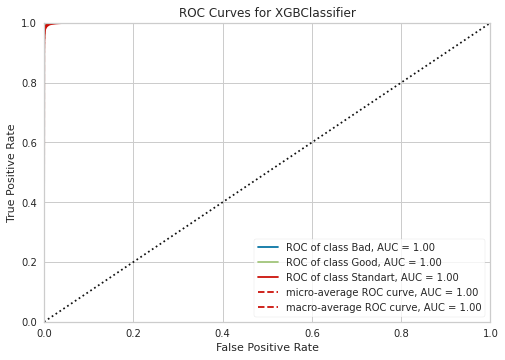

testing ROC/ AUC


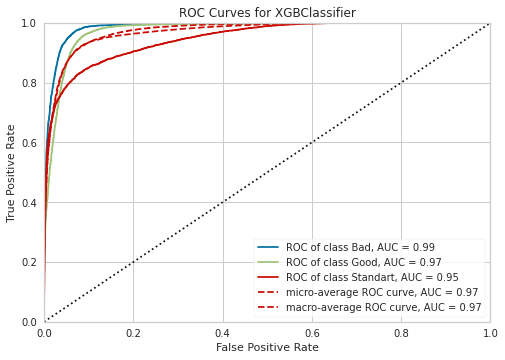

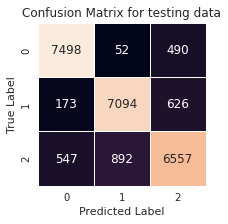

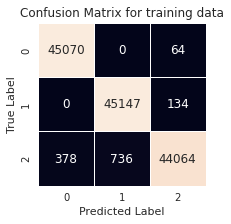

--- 52.68872904777527 seconds ---
CPU times: user 3min 21s, sys: 714 ms, total: 3min 21s
Wall time: 52.7 s


In [52]:
%%time

info_of_data_from_model(xgb_model, x_train_smote, x_test_smote,
                        y_train_smote, y_test_smote, show_train = True)

testing accuracy = 0.9609

 testing clasification report:
               precision    recall  f1-score   support

         0.0       0.95      0.97      0.96      1810
         1.0       0.94      0.97      0.96      2881
         2.0       0.97      0.95      0.96      5309

    accuracy                           0.96     10000
   macro avg       0.96      0.96      0.96     10000
weighted avg       0.96      0.96      0.96     10000

testing ROC/ AUC


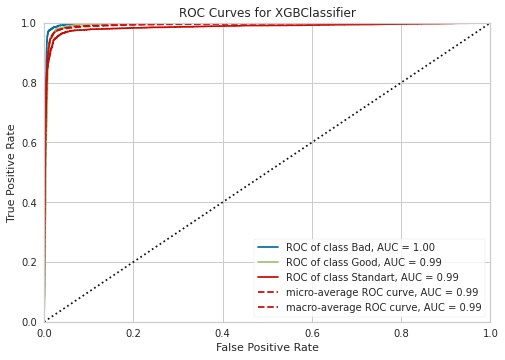

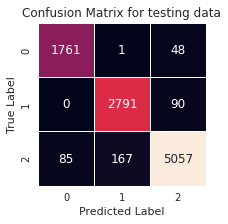

--- 4.173370838165283 seconds ---
CPU times: user 13.8 s, sys: 309 ms, total: 14.1 s
Wall time: 4.17 s


In [53]:
%%time

info_of_data_from_model(xgb_model, x_train_smote, x_test,
                        y_train_smote, y_test, show_train = False)

In [198]:
pickle.dump(xgb_model, open("xgb_model_2500_est.pkl", 'wb'))

In [54]:
xgb_model.save_model("xgb_model_2000_est.json")
# save in text format
xgb_model.save_model("xgb_model_2000_est.txt")

In [55]:
model2 = xgb.XGBClassifier(n_estimators=2000)
model2.load_model("xgb_model_2000_est.json")

testing accuracy = 0.9609

 testing clasification report:
               precision    recall  f1-score   support

         0.0       0.95      0.97      0.96      1810
         1.0       0.94      0.97      0.96      2881
         2.0       0.97      0.95      0.96      5309

    accuracy                           0.96     10000
   macro avg       0.96      0.96      0.96     10000
weighted avg       0.96      0.96      0.96     10000

testing ROC/ AUC


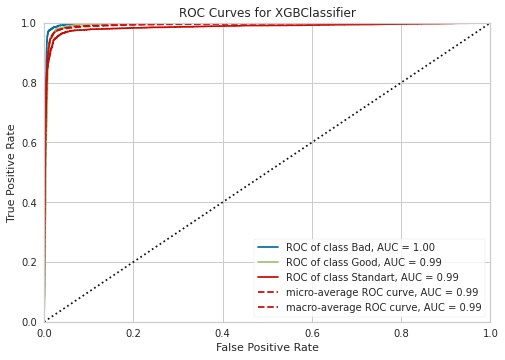

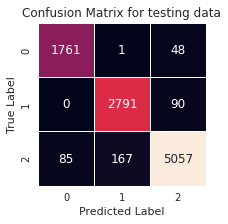

--- 3.7790327072143555 seconds ---
CPU times: user 13.6 s, sys: 290 ms, total: 13.9 s
Wall time: 3.78 s


In [56]:
%%time

info_of_data_from_model(model2, x_train_smote, x_test,
                        y_train_smote, y_test, show_train = False)

In [58]:
enc = pickle.load(open('/kaggle/working/ordinal_encoder.pkl', 'rb'))
enc

OrdinalEncoder()

In [59]:
enc.categories_

[array(['Accountant', 'Architect', 'Developer', 'Doctor', 'Engineer',
        'Entrepreneur', 'Journalist', 'Lawyer', 'Manager', 'Mechanic',
        'Media_Manager', 'Musician', 'Scientist', 'Teacher', 'Writer'],
       dtype=object),
 array(['Bad', 'Good', 'Standard'], dtype=object),
 array(['NM', 'No', 'Yes'], dtype=object),
 array(['High_spent_Large_value_payments',
        'High_spent_Medium_value_payments',
        'High_spent_Small_value_payments',
        'Low_spent_Large_value_payments',
        'Low_spent_Medium_value_payments',
        'Low_spent_Small_value_payments'], dtype=object),
 array(['Good', 'Poor', 'Standard'], dtype=object)]

> ***3. Logistic regression classifier model***

In [174]:
%%time

import sklearn
lr_model = sklearn.linear_model.LogisticRegression(class_weight = "balanced")
lr_model.fit(x_train_smote, y_train_smote)

CPU times: user 21.6 s, sys: 15.9 s, total: 37.4 s
Wall time: 9.96 s


/opt/conda/lib/python3.7/site-packages/sklearn/linear_model/_logistic.py:818: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression



LogisticRegression(class_weight='balanced')

training accuracy = 0.6923808751189221
testing accuracy = 0.6929249028375611

 training clasification report:
               precision    recall  f1-score   support

         0.0       0.70      0.82      0.76     45134
         1.0       0.73      0.66      0.69     45281
         2.0       0.65      0.59      0.62     45178

    accuracy                           0.69    135593
   macro avg       0.69      0.69      0.69    135593
weighted avg       0.69      0.69      0.69    135593


 testing clasification report:
               precision    recall  f1-score   support

         0.0       0.71      0.83      0.76      8040
         1.0       0.72      0.66      0.69      7893
         2.0       0.65      0.59      0.62      7996

    accuracy                           0.69     23929
   macro avg       0.69      0.69      0.69     23929
weighted avg       0.69      0.69      0.69     23929

train ROC/ AUC


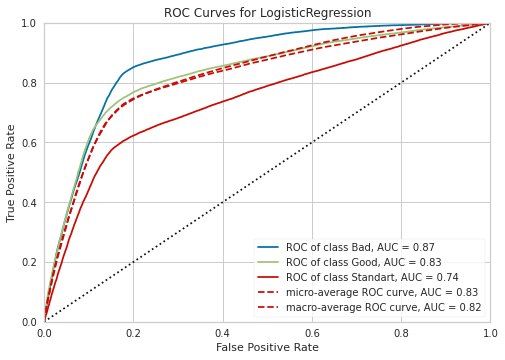

testing ROC/ AUC


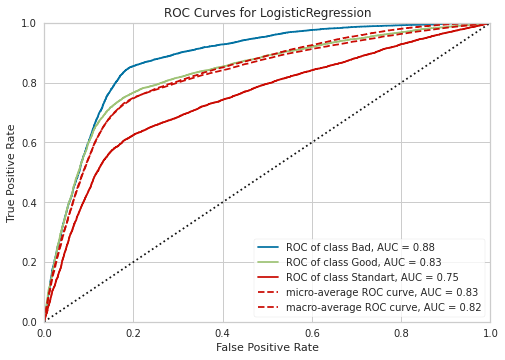

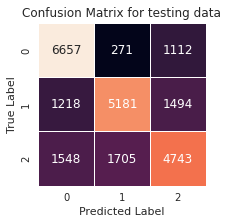

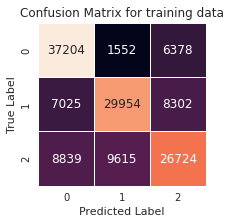

--- 2.4795186519622803 seconds ---
CPU times: user 3.9 s, sys: 2.02 s, total: 5.93 s
Wall time: 2.48 s


In [177]:
%%time

info_of_data_from_model(lr_model, x_train_smote, x_test_smote,
                        y_train_smote, y_test_smote, show_train = True)

testing accuracy = 0.6594

 testing clasification report:
               precision    recall  f1-score   support

         0.0       0.51      0.83      0.63      1810
         1.0       0.62      0.66      0.64      2881
         2.0       0.80      0.60      0.69      5309

    accuracy                           0.66     10000
   macro avg       0.64      0.70      0.65     10000
weighted avg       0.70      0.66      0.66     10000

testing ROC/ AUC


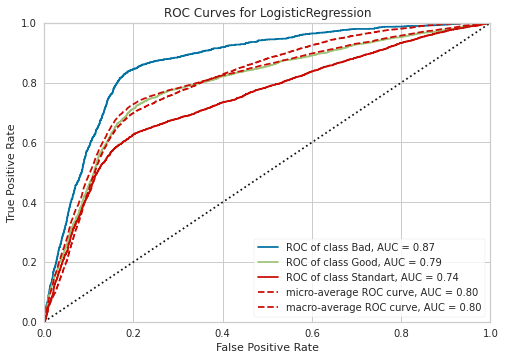

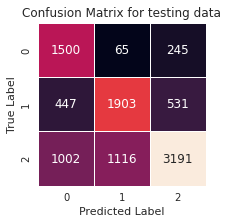

--- 0.792489767074585 seconds ---
CPU times: user 1.36 s, sys: 822 ms, total: 2.18 s
Wall time: 793 ms


In [178]:
%%time

info_of_data_from_model(lr_model, x_train_smote, x_test,
                        y_train_smote, y_test, show_train = False)

> ***4. Random Forest classifier model***

In [187]:
%%time
from sklearn.ensemble import RandomForestClassifier

rfc_model = RandomForestClassifier(
    class_weight = 'balanced',
#     n_estimators = 1000
)
rfc_model.fit(x_train_smote, y_train_smote)

CPU times: user 1min 1s, sys: 605 ms, total: 1min 2s
Wall time: 1min 2s


RandomForestClassifier(class_weight='balanced')

training accuracy = 0.9998229997123745
testing accuracy = 0.8854527978603368

 training clasification report:
               precision    recall  f1-score   support

         0.0       1.00      1.00      1.00     45134
         1.0       1.00      1.00      1.00     45281
         2.0       1.00      1.00      1.00     45178

    accuracy                           1.00    135593
   macro avg       1.00      1.00      1.00    135593
weighted avg       1.00      1.00      1.00    135593


 testing clasification report:
               precision    recall  f1-score   support

         0.0       0.91      0.94      0.92      8040
         1.0       0.88      0.91      0.90      7893
         2.0       0.87      0.80      0.83      7996

    accuracy                           0.89     23929
   macro avg       0.88      0.89      0.88     23929
weighted avg       0.88      0.89      0.88     23929

train ROC/ AUC


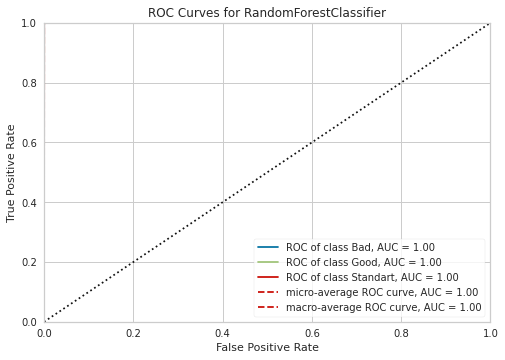

testing ROC/ AUC


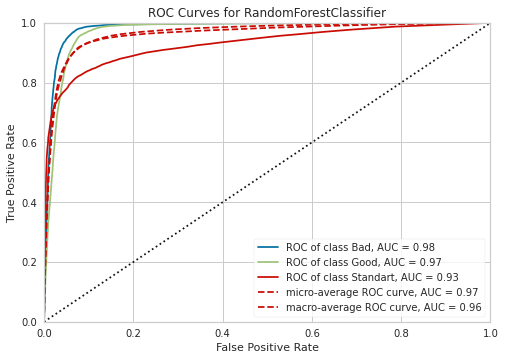

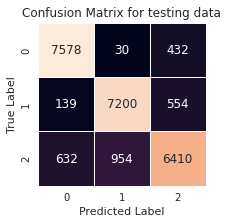

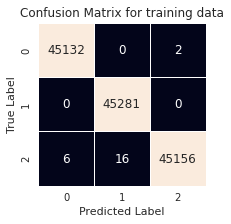

--- 30.355965614318848 seconds ---
CPU times: user 30.7 s, sys: 609 ms, total: 31.3 s
Wall time: 30.4 s


In [188]:
%%time

info_of_data_from_model(rfc_model, x_train_smote, x_test_smote,
                        y_train_smote, y_test_smote, show_train = True)

testing accuracy = 0.9751

 testing clasification report:
               precision    recall  f1-score   support

         0.0       0.97      0.98      0.97      1810
         1.0       0.96      0.98      0.97      2881
         2.0       0.98      0.97      0.98      5309

    accuracy                           0.98     10000
   macro avg       0.97      0.98      0.97     10000
weighted avg       0.98      0.98      0.98     10000

testing ROC/ AUC


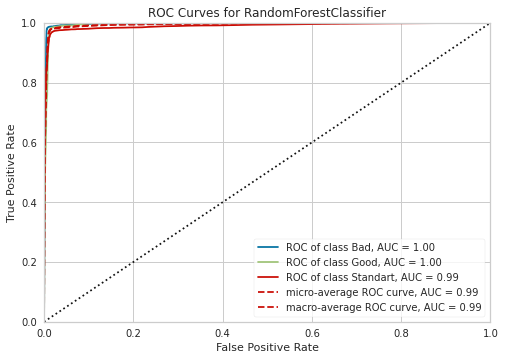

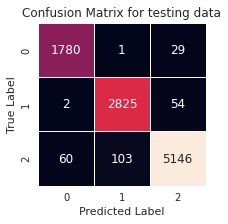

--- 2.83646297454834 seconds ---
CPU times: user 3.01 s, sys: 298 ms, total: 3.31 s
Wall time: 2.84 s


In [189]:
%%time

info_of_data_from_model(rfc_model, x_train_smote, x_test,
                        y_train_smote, y_test, show_train = False)

In [190]:
pickle.dump(rfc_model, open("rfc_model.pkl", 'wb'))

In [193]:
len(rfc_model.estimators_)

100

## **Feature importances**

In [224]:
def show_features_importances(model, model_name):
    col_list = list(df.columns.values)
    col_list.remove('Credit_Score')
    imp_df = pd.DataFrame({
        'features' : col_list,
        'importances' : model.feature_importances_
    })
    imp_df = imp_df.sort_values(by=['importances'], ascending=False)
    plt.barh(imp_df.features, imp_df.importances)
    plt.title('feature importances according to ' + model_name)
    plt.ylabel('features')
    plt.xlabel('importances')
    plt.show()

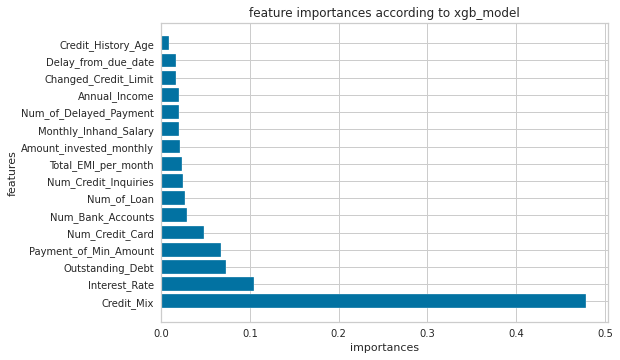

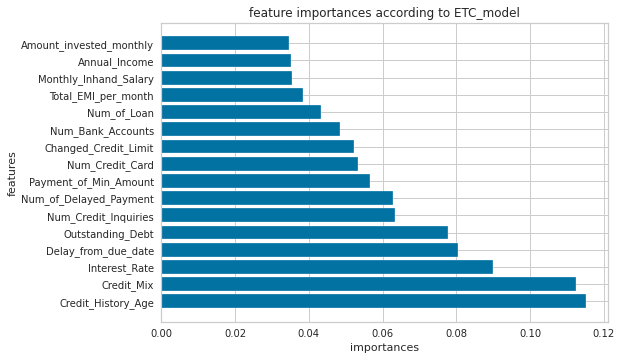

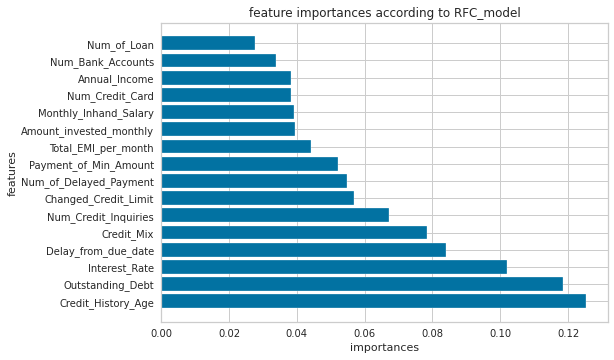

In [225]:
show_features_importances(xgb_model, 'xgb_model')
show_features_importances(ETC_model, 'ETC_model')
show_features_importances(rfc_model, 'RFC_model')

In [228]:
enc = pickle.load(open('./ordinal_encoder.pkl', "rb"))
enc.categories_

[array(['Accountant', 'Architect', 'Developer', 'Doctor', 'Engineer',
        'Entrepreneur', 'Journalist', 'Lawyer', 'Manager', 'Mechanic',
        'Media_Manager', 'Musician', 'Scientist', 'Teacher', 'Writer'],
       dtype=object),
 array(['Bad', 'Good', 'Standard'], dtype=object),
 array(['NM', 'No', 'Yes'], dtype=object),
 array(['High_spent_Large_value_payments',
        'High_spent_Medium_value_payments',
        'High_spent_Small_value_payments',
        'Low_spent_Large_value_payments',
        'Low_spent_Medium_value_payments',
        'Low_spent_Small_value_payments'], dtype=object),
 array(['Good', 'Poor', 'Standard'], dtype=object)]

In [229]:
loaded_model = pickle.load(open('/kaggle/working/xgb_model.pkl', "rb"))
loaded_model

XGBClassifier(base_score=0.5, booster='gbtree', callbacks=None,
              colsample_bylevel=1, colsample_bynode=1, colsample_bytree=1,
              early_stopping_rounds=None, enable_categorical=False,
              eval_metric=None, gamma=0, gpu_id=-1, grow_policy='depthwise',
              importance_type=None, interaction_constraints='',
              learning_rate=0.300000012, max_bin=256, max_cat_to_onehot=4,
              max_delta_step=0, max_depth=6, max_leaves=0, min_child_weight=1,
              missing=nan, monotone_constraints='()', n_estimators=600,
              n_jobs=0, num_parallel_tree=1, objective='multi:softprob',
              predictor='auto', random_state=0, reg_alpha=0, ...)

In [231]:
df[cols_to_be_scaled].mean(), df[cols_to_be_scaled].std()

(Annual_Income              2.643219e-16
 Monthly_Inhand_Salary      9.180212e-17
 Outstanding_Debt           0.000000e+00
 Credit_History_Age        -2.657430e-17
 Total_EMI_per_month       -1.477218e-16
 Amount_invested_monthly    1.136868e-16
 dtype: float64,
 Annual_Income              1.0
 Monthly_Inhand_Salary      1.0
 Outstanding_Debt           1.0
 Credit_History_Age         1.0
 Total_EMI_per_month        1.0
 Amount_invested_monthly    1.0
 dtype: float64)

In [234]:
dataframe = pd.read_csv(config.input_dataframe_string)
dataframe[cols_to_be_scaled].mean(), dataframe[cols_to_be_scaled].std()

(Annual_Income              50505.123449
 Monthly_Inhand_Salary       4197.270835
 Outstanding_Debt            1426.220376
 Credit_History_Age           221.220460
 Total_EMI_per_month          107.699208
 Amount_invested_monthly       55.101315
 dtype: float64,
 Annual_Income              38299.422093
 Monthly_Inhand_Salary       3186.432497
 Outstanding_Debt            1155.129026
 Credit_History_Age            99.680716
 Total_EMI_per_month          132.267056
 Amount_invested_monthly       39.006932
 dtype: float64)

In [233]:
df.shape

(100000, 17)

In [239]:
dataframe[cols_to_be_scaled].mean().index

Index(['Annual_Income', 'Monthly_Inhand_Salary', 'Outstanding_Debt',
       'Credit_History_Age', 'Total_EMI_per_month', 'Amount_invested_monthly'],
      dtype='object')

In [246]:
mean_df = pd.DataFrame({
    'cols' : dataframe[cols_to_be_scaled].mean().index,
    'mean' : dataframe[cols_to_be_scaled].mean()
})
std_df = pd.DataFrame({
    'cols' : dataframe[cols_to_be_scaled].std().index,
    'std' : dataframe[cols_to_be_scaled].std()
})
display(mean_df)
display(std_df)

,cols,mean
Annual_Income,Annual_Income,50505.123449
Monthly_Inhand_Salary,Monthly_Inhand_Salary,4197.270835
Outstanding_Debt,Outstanding_Debt,1426.220376
Credit_History_Age,Credit_History_Age,221.220460
Total_EMI_per_month,Total_EMI_per_month,107.699208
Amount_invested_monthly,Amount_invested_monthly,55.101315


,cols,std
Annual_Income,Annual_Income,38299.422093
Monthly_Inhand_Salary,Monthly_Inhand_Salary,3186.432497
Outstanding_Debt,Outstanding_Debt,1155.129026
Credit_History_Age,Credit_History_Age,99.680716
Total_EMI_per_month,Total_EMI_per_month,132.267056
Amount_invested_monthly,Amount_invested_monthly,39.006932


In [247]:
mean_df.to_csv('scaled_columns_mean.csv', index=False)
std_df.to_csv('scaled_columns_std.csv', index=False)

In [248]:
mean_df = pd.read_csv('./scaled_columns_mean.csv')
mean_df

,cols,mean
0,Annual_Income,50505.123449
1,Monthly_Inhand_Salary,4197.270835
2,Outstanding_Debt,1426.220376
3,Credit_History_Age,221.220460
4,Total_EMI_per_month,107.699208
5,Amount_invested_monthly,55.101315


In [249]:
std_df = pd.read_csv('./scaled_columns_std.csv')
std_df

,cols,std
0,Annual_Income,38299.422093
1,Monthly_Inhand_Salary,3186.432497
2,Outstanding_Debt,1155.129026
3,Credit_History_Age,99.680716
4,Total_EMI_per_month,132.267056
5,Amount_invested_monthly,39.006932


In [ ]:
s